# Wine Quality Prediction - Part 2 - Multiclass Classification

![](https://cdn.pixabay.com/photo/2016/03/09/11/53/wine-glasses-1246240_1280.jpg)

# Introduction

This notebook is part of a trilogy in which I will approach the wine quality dataset from several different approaches:

+ [Part 1: Supervised Learning - Regression](https://www.kaggle.com/sgtsteiner/red-wine-quality-regression)
+ [Part 2: Supervised Learning - Multiclass Classification](https://www.kaggle.com/sgtsteiner/red-wine-quality-multiclass-classification)
+ [Part 3: Supervised Learning - Binary Classification](https://www.kaggle.com/sgtsteiner/red-wine-quality-binary-classification)

# Frame the problem

We have a dataset that contains various characteristics of red and white variants of the Portuguese "Vinho Verde" wine. We have chemical variables, such as the amount of alcohol, citric acid, acidity, density, pH, etc; as well as a sensorial and subjective variable such as the score with which a group of experts rated the quality of the wine: between 0 (very bad) and 10 (very excellent).

They ask us to build a model that can predict the quality score given these biochemical indicators.

In the [first part of this analysis](https://www.kaggle.com/sgtsteiner/red-wine-quality-regression) we approach the problem as supervised learning - regression. We cannot consider the resulting model satisfactory. Let's consider the problem as supervised learning - multiclass classification.

# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import RandomizedSearchCV, cross_val_score 
from sklearn.model_selection import cross_validate, cross_val_predict, StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.linear_model import SGDClassifier
from sklearn.dummy import DummyClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn import metrics

import xgboost as xgb

import pandas_profiling

%matplotlib inline

seed = 42

import warnings
warnings.filterwarnings('ignore')

# Get the Data

In [2]:
red = pd.read_csv("../input/red-wine-quality-cortez-et-al-2009/winequality-red.csv")

# Explore the Data

In [3]:
red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
red.profile_report()

We are not going to delve into data exploration, as we already did in the [first part of this analysis](https://www.kaggle.com/sgtsteiner/red-wine-quality-regression). The only preprocessing we are going to do is convert the target variable "quality" to categorical.

In [5]:
red["quality_cat"] = red["quality"].astype("category")

In [6]:
red["quality_cat"].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality_cat, dtype: int64

In [7]:
print(f"Percentage of quality scores")
red["quality_cat"].value_counts(normalize=True)*100

Percentage of quality scores


5    42.589118
6    39.899937
7    12.445278
4     3.314572
8     1.125704
3     0.625391
Name: quality_cat, dtype: float64

It is significantly unbalanced. Most instances (82%) have scores of 6 or 5.

# Select and train models

The goal of this phase is to train many models quickly and unrefined, of different categories (i.e. Random Forests, AdaBoost, Extra Tree, etc.) using the standard parameters. The idea is to have a quick overview of which models are most promising. Measure and compare the performance of all of them. Select the best models.

Create the predictor dataset and the dataset with the target variable:

In [8]:
predict_columns = red.columns[:-2]
predict_columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [9]:
X = red[predict_columns]
y = red["quality_cat"]

Create the training and test datasets:

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    random_state=42, 
                                                    test_size=0.2)

## Baseline

First, we are going to train a dummy classifier that we will use as a baseline with which to compare.

In [11]:
clf_dummy = DummyClassifier(strategy="uniform", random_state=seed) # Random prediction
clf_dummy.fit(X_train, y_train)

DummyClassifier(random_state=42, strategy='uniform')

In [12]:
cross_val_score(clf_dummy, X_train, y_train, cv=3, 
                scoring="accuracy", n_jobs=-1).mean()

0.16108673901331486

As we can see, a classifier that predicts randomly obtains an accuracy of 16%.

In [13]:
# Always predict the most frequent class
clf_dummy = DummyClassifier(strategy="most_frequent", random_state=seed) 
clf_dummy.fit(X_train, y_train)

DummyClassifier(random_state=42, strategy='most_frequent')

In [14]:
cross_val_score(clf_dummy, X_train, y_train, cv=3, 
                scoring="accuracy", n_jobs=-1).mean()

0.4308052321213254

A classifier that always predicts the most frequent class (in our case the quality score 6) obtains an accuracy of 43%. We are going to take the prediction of this dummy classifier as our baseline.

In [15]:
preds = cross_val_predict(clf_dummy, X_train, y_train, cv=3, n_jobs=-1)

In [16]:
conf_mx = metrics.confusion_matrix(y_train, preds)
conf_mx

array([[  0,   0,   9,   0,   0,   0],
       [  0,   0,  43,   0,   0,   0],
       [  0,   0, 551,   0,   0,   0],
       [  0,   0, 506,   0,   0,   0],
       [  0,   0, 157,   0,   0,   0],
       [  0,   0,  13,   0,   0,   0]])

In [17]:
pd.crosstab(y_train, preds, rownames = ['Real'], colnames =['Predicted'])

Predicted,5
Real,
3,9
4,43
5,551
6,506
7,157
8,13


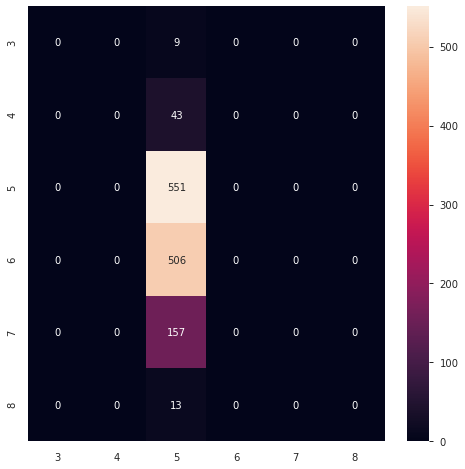

In [18]:
fig = plt.figure(figsize=(8,8))
ax = sns.heatmap(conf_mx, annot=True, fmt="d", 
                 xticklabels=clf_dummy.classes_,
                 yticklabels=clf_dummy.classes_,)

In [19]:
accuracy_base = metrics.accuracy_score(y_train, preds)
precision_base = metrics.precision_score(y_train, preds, average='weighted', 
                                         zero_division=0)
recall_base = metrics.recall_score(y_train, preds, average='weighted')
f1_base = metrics.f1_score(y_train, preds, average='weighted')
print(f"Accuracy: {accuracy_base}")
print(f"Precision: {precision_base}")
print(f"Recall: {recall_base}")
print(f"f1: {f1_base}")

Accuracy: 0.43080531665363564
Precision: 0.18559322085703928
Recall: 0.43080531665363564
f1: 0.25942484095754453


In [20]:
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00        43
           5       0.43      1.00      0.60       551
           6       0.00      0.00      0.00       506
           7       0.00      0.00      0.00       157
           8       0.00      0.00      0.00        13

    accuracy                           0.43      1279
   macro avg       0.07      0.17      0.10      1279
weighted avg       0.19      0.43      0.26      1279



Our dummy classifier is correct only 19% of the time (precision) and detects 43% of the actual scores (recall). It is often convenient to combine precision and sensitivity into a single metric called the F1 score, particularly if we need a simple way to compare two classifiers. The F1 score is the harmonic mean of precision and sensitivity. While the regular mean treats all values equally, the harmonic mean gives much more weight to low values. As a result, the classifier will only score high on F1 if both sensitivity and precision are high. In our case, F1 = 0.26. Okay, let's take these three metrics as our initial baseline.

## Shortlist Promising Models

In [21]:
def evaluate_model(estimator, X_train, y_train, cv=5, verbose=True):
    """Print and return cross validation of model
    """
    scoring = {"accuracy": "accuracy",
               "precision": "precision_weighted",
               "recall": "recall_weighted",
               "f1": "f1_weighted"}
    scores = cross_validate(estimator, X_train, y_train, cv=cv, scoring=scoring)
    
    accuracy, accuracy_std = scores['test_accuracy'].mean(), \
                                scores['test_accuracy'].std()
    
    precision, precision_std = scores['test_precision'].mean(), \
                                scores['test_precision'].std()
    
    recall, recall_std = scores['test_recall'].mean(), \
                                scores['test_recall'].std()
    
    f1, f1_std = scores['test_f1'].mean(), scores['test_f1'].std()

    
    result = {
        "Accuracy": accuracy,
        "Accuracy std": accuracy_std,
        "Precision": precision,
        "Precision std": precision_std,
        "Recall": recall,
        "Recall std": recall_std,
        "f1": f1,
        "f1 std": f1_std,
    }
    
    if verbose:
        print(f"Accuracy: {accuracy} - (std: {accuracy_std})")
        print(f"Precision: {precision} - (std: {precision_std})")
        print(f"Recall: {recall} - (std: {recall_std})")
        print(f"f1: {f1} - (std: {f1_std})")

    return result

In [22]:
models = [GaussianNB(), KNeighborsClassifier(), RandomForestClassifier(random_state=seed),
          DecisionTreeClassifier(random_state=seed), ExtraTreeClassifier(random_state=seed), 
          AdaBoostClassifier(random_state=seed), GradientBoostingClassifier(random_state=seed), 
          xgb.XGBClassifier()]

model_names = ["Naive Bayes Gaussian", "K Neighbors Classifier", "Random Forest",
               "Decision Tree", "Extra Tree", "Ada Boost", 
               "Gradient Boosting", "XGBoost"]

In [23]:
accuracy = []
precision = []
recall = []
f1 = []

for model in range(len(models)):
    print(f"Step {model+1} de {len(models)}")
    print(f"...running {model_names[model]}")
    
    clf_scores = evaluate_model(models[model], X_train, y_train)
    
    accuracy.append(clf_scores["Accuracy"])
    precision.append(clf_scores["Precision"])
    recall.append(clf_scores["Recall"])
    f1.append(clf_scores["f1"])

Step 1 de 8
...running Naive Bayes Gaussian
Accuracy: 0.55125 - (std: 0.027102056829233452)
Precision: 0.5646348802130249 - (std: 0.020745595731671666)
Recall: 0.55125 - (std: 0.027102056829233452)
f1: 0.5541082295110215 - (std: 0.023545313928114795)
Step 2 de 8
...running K Neighbors Classifier
Accuracy: 0.4964828431372549 - (std: 0.013777320430796238)
Precision: 0.472985448646598 - (std: 0.015072330289309464)
Recall: 0.4964828431372549 - (std: 0.013777320430796238)
f1: 0.4749703234382818 - (std: 0.01350721905804416)
Step 3 de 8
...running Random Forest
Accuracy: 0.6826194852941176 - (std: 0.03746156433885403)
Precision: 0.6585977991402794 - (std: 0.0406774341137893)
Recall: 0.6826194852941176 - (std: 0.03746156433885403)
f1: 0.6642629277794576 - (std: 0.03850557708999431)
Step 4 de 8
...running Decision Tree
Accuracy: 0.6012714460784314 - (std: 0.028539445741031087)
Precision: 0.5978218408820158 - (std: 0.025874687130953537)
Recall: 0.6012714460784314 - (std: 0.028539445741031087)
f1

Let's see the performance of each of them:

In [24]:
df_result = pd.DataFrame({"Model": model_names,
                          "accuracy": accuracy,
                          "precision": precision,
                          "recall": recall,
                          "f1": f1})
df_result.sort_values(by="f1", ascending=False)

,Model,accuracy,precision,recall,f1
2,Random Forest,0.682619,0.658598,0.682619,0.664263
7,XGBoost,0.656008,0.634663,0.656008,0.642069
6,Gradient Boosting,0.646651,0.621008,0.646651,0.632031
3,Decision Tree,0.601271,0.597822,0.601271,0.597899
4,Extra Tree,0.567635,0.569740,0.567635,0.566832
0,Naive Bayes Gaussian,0.551250,0.564635,0.551250,0.554108
5,Ada Boost,0.550475,0.484577,0.550475,0.505221
1,K Neighbors Classifier,0.496483,0.472985,0.496483,0.474970


We are going to visualize the comparison of the different models / metrics:

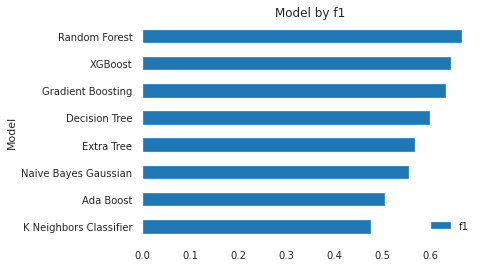

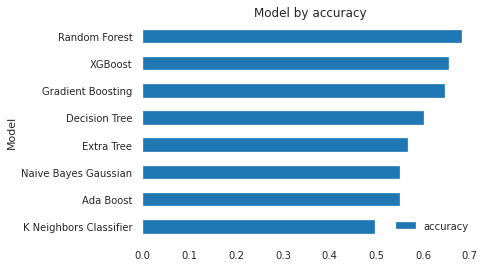

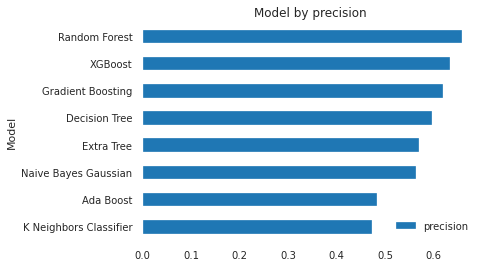

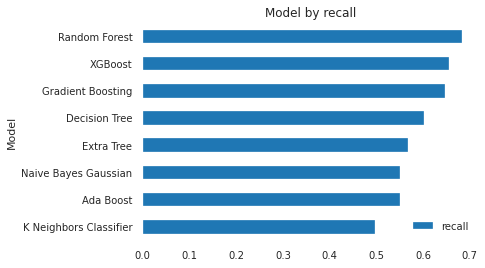

In [25]:
metrics_list = ["f1", "accuracy", "precision", "recall"]

for metric in metrics_list:
    df_result.sort_values(by=metric).plot.barh("Model", metric)
    plt.title(f"Model by {metric}")
    plt.show()

The best performing model is Random Forest. Let's examine the execution of Random Forest a little more in detail:

In [26]:
clf_rf = RandomForestClassifier(random_state=seed)
preds = cross_val_predict(clf_rf, X_train, y_train, cv=5, n_jobs=-1)

In [27]:
clf_rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

In [28]:
pd.crosstab(y_train, preds, rownames = ['Real'], colnames =['Predicted'])

Predicted,3,4,5,6,7,8
Real,,,,,,
3,0,1,7,1,0,0
4,1,0,32,9,1,0
5,0,2,434,108,7,0
6,0,1,116,364,25,0
7,0,0,14,70,73,0
8,0,0,0,6,5,2


In [29]:
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00        43
           5       0.72      0.79      0.75       551
           6       0.65      0.72      0.68       506
           7       0.66      0.46      0.54       157
           8       1.00      0.15      0.27        13

    accuracy                           0.68      1279
   macro avg       0.50      0.35      0.37      1279
weighted avg       0.66      0.68      0.66      1279



Our model is correct 66% of the time (precision) and detects 68% of the actual scores (recall). The F1 score is 0.66. Well, it has improved our baseline significantly (remember, precision = 19%, recall = 43%, and F1 = 0.26).

When examining in detail the result of the predictions, we can see that it is terrible in the extreme scores (3, 4 and 8) and quite bad in the score 7.

# Fine-Tune

We are going to do a hyperparameter adjustment to see if any improvement is achieved.

In [30]:
param_grid = [
    {"n_estimators": range(20, 200, 20), 
     "bootstrap": [True, False],
     "criterion": ["gini", "entropy"],   
     "max_depth": [2, 4, 6, 8, 10, 12, 14, None],
     "max_features": ["auto", "sqrt", "log2"], 
     "min_samples_split": [2, 5, 10],
     "min_samples_leaf": [1, 2, 4],
     }
]

clf_rf = RandomForestClassifier(random_state=seed, n_jobs=-1)

## Initial fine-tune with Randomized Search

First we do a random quick sweep:

In [31]:
clf_random = RandomizedSearchCV(clf_rf, param_grid, n_iter = 200, cv = 5, 
                                scoring="f1_weighted", verbose=2, 
                                random_state=seed, n_jobs = -1)

In [32]:
clf_random.fit(X_train, y_train)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  3.1min finished


RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=200, n_jobs=-1,
                   param_distributions=[{'bootstrap': [True, False],
                                         'criterion': ['gini', 'entropy'],
                                         'max_depth': [2, 4, 6, 8, 10, 12, 14,
                                                       None],
                                         'max_features': ['auto', 'sqrt',
                                                          'log2'],
                                         'min_samples_leaf': [1, 2, 4],
                                         'min_samples_split': [2, 5, 10],
                                         'n_estimators': range(20, 200, 20)}],
                   random_state=42, scoring='f1_weighted', verbose=2)

In [33]:
clf_random.best_params_

{'n_estimators': 40,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 10,
 'criterion': 'entropy',
 'bootstrap': False}

In [34]:
preds = cross_val_predict(clf_random.best_estimator_, 
                          X_train, y_train, 
                          cv=5, n_jobs=-1)
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00        43
           5       0.72      0.81      0.76       551
           6       0.66      0.71      0.68       506
           7       0.66      0.46      0.55       157
           8       1.00      0.15      0.27        13

    accuracy                           0.69      1279
   macro avg       0.51      0.36      0.38      1279
weighted avg       0.66      0.69      0.67      1279



## Final fine-tune with GridSearch

In [35]:
param_grid = [
    {"n_estimators": range(20, 100, 10), 
     "bootstrap": [True, False],
     "criterion": ["gini", "entropy"],   
     "max_depth": [2, 4, 6, 8, 10, 12, 14, None],
     "max_features": ["auto", "sqrt", "log2"], 
     "min_samples_split": [2, 5, 10],
     "min_samples_leaf": [1, 2, 4],
     }
]


clf_rf = RandomForestClassifier(random_state=seed, n_jobs=-1)

In [36]:
grid_search = GridSearchCV(clf_rf, param_grid, cv=5,
                           scoring="f1_weighted", verbose=2, n_jobs=-1)

In [37]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 6912 candidates, totalling 34560 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:   36.2s
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 1977 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 2584 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 3273 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 4893 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 5824 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 6837 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 7930 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 9105 tasks      | 

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid=[{'bootstrap': [True, False],
                          'criterion': ['gini', 'entropy'],
                          'max_depth': [2, 4, 6, 8, 10, 12, 14, None],
                          'max_features': ['auto', 'sqrt', 'log2'],
                          'min_samples_leaf': [1, 2, 4],
                          'min_samples_split': [2, 5, 10],
                          'n_estimators': range(20, 100, 10)}],
             scoring='f1_weighted', verbose=2)

In [38]:
grid_search.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 60}

In [39]:
final_model = grid_search.best_estimator_
preds = cross_val_predict(final_model, X_train, y_train, cv=5, n_jobs=-1)

In [40]:
pd.crosstab(y_train, preds, rownames = ['Actual'], colnames =['Predicción'])

Predicción,3,4,5,6,7,8
Actual,,,,,,
3,0,1,6,2,0,0
4,1,0,32,9,1,0
5,0,1,454,89,7,0
6,0,0,119,357,30,0
7,0,0,12,69,76,0
8,0,0,0,5,6,2


In [41]:
print(metrics.classification_report(y_train, preds))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00        43
           5       0.73      0.82      0.77       551
           6       0.67      0.71      0.69       506
           7       0.63      0.48      0.55       157
           8       1.00      0.15      0.27        13

    accuracy                           0.70      1279
   macro avg       0.51      0.36      0.38      1279
weighted avg       0.67      0.70      0.68      1279



After adjusting hyperparameters, a very slight improvement is achieved over the default hyperparameters. It's correct 67% of the time (precision) and detects 70% of the actual scores (recall). The F1 score is 0.68. Which significantly improves our baseline (remember, precision = 19%, recall = 43% and F1 = 0.26).

Finally let's see how it runs on the test set:

In [42]:
y_pred = final_model.predict(X_test)

pd.crosstab(y_test, y_pred, rownames = ['Actual'], colnames =['Predicción'])

Predicción,5,6,7,8
Actual,,,,
3,1,0,0,0
4,7,3,0,0
5,98,31,1,0
6,31,94,7,0
7,0,21,20,1
8,0,2,3,0


In [43]:
print(metrics.classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00        10
           5       0.72      0.75      0.73       130
           6       0.62      0.71      0.66       132
           7       0.65      0.48      0.55        42
           8       0.00      0.00      0.00         5

    accuracy                           0.66       320
   macro avg       0.33      0.32      0.32       320
weighted avg       0.63      0.66      0.64       320



It's correct 63% of the time (precision) and detects 66% of the actual scores (recall). The F1 score is 0.66. Which significantly improves our baseline (remember, precision = 19%, recall = 43% and F1 = 0.26).

In [44]:
conf_mx = metrics.confusion_matrix(y_test, y_pred)

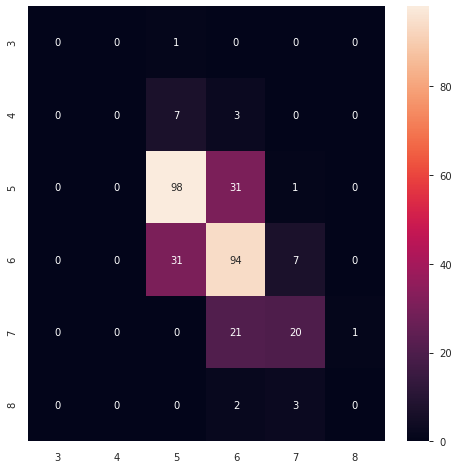

In [45]:
fig = plt.figure(figsize=(8,8))
ax = sns.heatmap(conf_mx, annot=True, fmt="d", 
                 xticklabels=final_model.classes_,
                 yticklabels=final_model.classes_,)

# Feature importances

In [46]:
feature_importances = final_model.feature_importances_
feature_importances

array([0.07468651, 0.10122316, 0.07794071, 0.07135544, 0.07814144,
       0.06727887, 0.09787504, 0.08495371, 0.07395018, 0.11834246,
       0.15425246])

In [47]:
sorted(zip(feature_importances, X_test.columns), reverse=True)

[(0.1542524584428395, 'alcohol'),
 (0.11834246070074023, 'sulphates'),
 (0.10122316042094585, 'volatile acidity'),
 (0.0978750437862035, 'total sulfur dioxide'),
 (0.08495371275088792, 'density'),
 (0.07814144440145228, 'chlorides'),
 (0.07794071476352166, 'citric acid'),
 (0.07468651233382716, 'fixed acidity'),
 (0.07395017713792401, 'pH'),
 (0.07135544060924111, 'residual sugar'),
 (0.06727887465241689, 'free sulfur dioxide')]

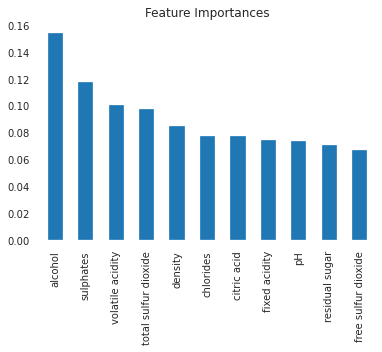

In [48]:
feature_imp = pd.Series(feature_importances, index=X_train.columns).sort_values(ascending=False)
feature_imp.plot(kind='bar')
plt.title('Feature Importances');

# Feature Selection

We are going to use RFECV to determine the number of valid features with cross-validation.

In [49]:
selector = RFECV(final_model, step=1, cv=StratifiedKFold())
selector = selector.fit(X_train, y_train)
pd.DataFrame({"Feature": predict_columns, "Support": selector.support_})

,Feature,Support
0,fixed acidity,True
1,volatile acidity,True
2,citric acid,True
3,residual sugar,True
4,chlorides,True
5,free sulfur dioxide,True
6,total sulfur dioxide,True
7,density,True
8,pH,True
9,sulphates,True


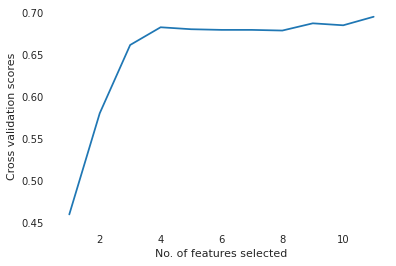

In [50]:
plt.figure()
plt.xlabel("No. of features selected")
plt.ylabel("Cross validation scores")
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_)
plt.show()

In [51]:
selector.grid_scores_

array([0.45970895, 0.58016238, 0.66150123, 0.68259804, 0.68025735,
       0.6794761 , 0.67946691, 0.67869179, 0.68729167, 0.68495404,
       0.69512561])

The conclusion is that all the variables are important for the model, since the maximum score is obtained with the 10 selected features.

## Conclusions

Our starting baseline, obtained from a classifier that always predicts the most frequent class, is the following:

+ Precision: **19%**
+ Recall: **43%**
+ Accuracy: **43%**
+ f1: **0.26**

After training various models, the one that has provided the best results is RandomForest. After fine-tuning the hyperparameters we obtain the following metrics:

+ Precision: **67%**
+ Recall: **70%**
+ Accuracy: **70%**
+ f1: **0.68**

The performance in the test set is as follows:

+ Precision: **63**
+ Recall: **66%**
+ Accuracy: **66%**
+ f1: **0.64**

Since this is multiclass classification, we are talking about weighted scores. However, the scores obtained by each class are very different. It can be seen that the result is terrible in the extreme scores (3, 4 and 8). As we saw in the distribution of the target variable, it is very unbalanced, there are hardly any observations for the extreme values, so the model does not have enough training data for all the quality scores.

All predictor variables are relevant to the model. The three that most affect prediction are the following:

+ alcohol
+ sulphates
+ volatile acidity

It could be interesting to evaluate the model by segmenting our target variable into quality ranges (for example, bad and good) and see if we obtain better results.